In [1]:
%matplotlib inline

import random
import time
import json
import os
import pickle
import numpy
import matplotlib
# matplotlib.use("tkagg")
import matplotlib.pyplot

import numpy as np
from tqdm.auto import tqdm

import torch

from torch import nn
from torch.optim import Adam
from torch.utils.data import DataLoader

from torchvision import datasets
from torchvision.utils import make_grid, save_image
from torchvision import transforms

import matplotlib.pyplot as plt
from pathlib import Path


def fix_experiment_seed(seed=0):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False


fix_experiment_seed()

results_folder = Path("./results")
results_folder.mkdir(exist_ok=True)
device = "cuda" if torch.cuda.is_available() else "cpu"

In [2]:
# Helper Functions
def show_image(image, nrow=8):
    # Input: image
    # Displays the image using matplotlib
    grid_img = make_grid(image.detach().cpu(), nrow=nrow, padding=0)
    plt.imshow(grid_img.permute(1, 2, 0))
    plt.axis('off')

In [3]:
# Training Hyperparameters
train_batch_size = 64  # Batch Size
z_dim = 32  # Latent Dimensionality
lr = 1e-4  # Learning Rate
# Define Dataset Statistics
image_size = 32
input_channels = 3
data_root = './data'

In [4]:
def get_dataloaders(data_root, batch_size):
    normalize = transforms.Normalize(mean=[0.5, 0.5, 0.5],
                                     std=[0.5, 0.5, 0.5])
    transform = transforms.Compose((
        transforms.Resize((image_size, image_size)),
        transforms.ToTensor(),
        normalize))

    train = datasets.SVHN(data_root, split='train', download=True, transform=transform)
    test = datasets.SVHN(data_root, split='test', download=True, transform=transform)

    train_dataloader = torch.utils.data.DataLoader(train, batch_size=batch_size, shuffle=True, drop_last=True)
    test_dataloader = torch.utils.data.DataLoader(test, batch_size=batch_size)

    return train_dataloader, test_dataloader

In [5]:
def save_logs(dictionary, log_dir):
    log_dir = os.path.join(log_dir)
    os.makedirs(log_dir, exist_ok=True)
    # Log arguments
    with open(os.path.join(log_dir, "log.json"), "w") as f:
        json.dump(dictionary, f, indent=2)

Using downloaded and verified file: ./data/train_32x32.mat
Using downloaded and verified file: ./data/test_32x32.mat


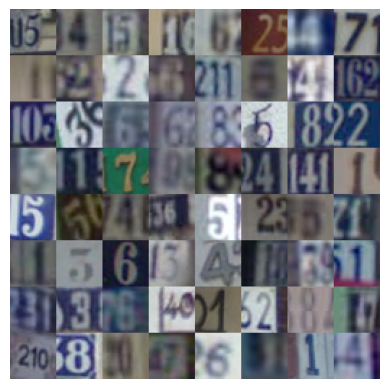

In [6]:
# Visualize the Dataset
def visualize():
    train_dataloader, _ = get_dataloaders(data_root=data_root, batch_size=train_batch_size)
    imgs, labels = next(iter(train_dataloader))

    save_image((imgs + 1) * 0.5, './results/orig.png')
    show_image((imgs + 1) * 0.5)


if __name__ == '__main__':
    visualize()

In [6]:
class Encoder(nn.Module):
    def __init__(self, nc, nef, nz, isize, device):
        super(Encoder, self).__init__()

        # Device
        self.device = device

        # Encoder: (nc, isize, isize) -> (nef*8, isize//16, isize//16)
        self.encoder = nn.Sequential(
            nn.Conv2d(nc, nef, 4, 2, padding=1),
            nn.LeakyReLU(0.2, True),
            nn.BatchNorm2d(nef),

            nn.Conv2d(nef, nef * 2, 4, 2, padding=1),
            nn.LeakyReLU(0.2, True),
            nn.BatchNorm2d(nef * 2),

            nn.Conv2d(nef * 2, nef * 4, 4, 2, padding=1),
            nn.LeakyReLU(0.2, True),
            nn.BatchNorm2d(nef * 4),

            nn.Conv2d(nef * 4, nef * 8, 4, 2, padding=1),
            nn.LeakyReLU(0.2, True),
            nn.BatchNorm2d(nef * 8),
        )

    def forward(self, inputs):
        batch_size = inputs.size(0)
        hidden = self.encoder(inputs)
        hidden = hidden.view(batch_size, -1)
        return hidden


class Decoder(nn.Module):
    def __init__(self, nc, ndf, nz, isize):
        super(Decoder, self).__init__()

        # Map the latent vector to the feature map space
        self.ndf = ndf
        self.out_size = isize // 16
        self.decoder_dense = nn.Sequential(
            nn.Linear(nz, ndf * 8 * self.out_size * self.out_size),
            nn.ReLU(True)
        )

        self.decoder_conv = nn.Sequential(
            nn.UpsamplingNearest2d(scale_factor=2),
            nn.Conv2d(ndf * 8, ndf * 4, 3, 1, padding=1),
            nn.LeakyReLU(0.2, True),

            nn.UpsamplingNearest2d(scale_factor=2),
            nn.Conv2d(ndf * 4, ndf * 2, 3, 1, padding=1),
            nn.LeakyReLU(0.2, True),

            nn.UpsamplingNearest2d(scale_factor=2),
            nn.Conv2d(ndf * 2, ndf, 3, 1, padding=1),
            nn.LeakyReLU(0.2, True),

            nn.UpsamplingNearest2d(scale_factor=2),
            nn.Conv2d(ndf, nc, 3, 1, padding=1)
        )

    def forward(self, input):
        batch_size = input.size(0)
        hidden = self.decoder_dense(input).view(batch_size, self.ndf * 8, self.out_size, self.out_size)
        output = self.decoder_conv(hidden)
        return output

In [7]:
class DiagonalGaussianDistribution(object):
    # Gaussian Distribution with diagonal covariance matrix
    def __init__(self, mean, logvar=None):
        super(DiagonalGaussianDistribution, self).__init__()
        self.mean = mean
        if logvar is None:
            logvar = torch.zeros_like(self.mean)
        self.logvar = torch.clamp(logvar, -30, 20)

        self.std = torch.exp(0.5 * self.logvar)
        self.var = torch.exp(self.logvar)

    def sample(self):
        return self.mean + self.std * torch.randn(size=self.mean.shape).to(self.mean.device)

    def kl(self):
        return - 1 / 2 * (1 + self.logvar - self.mean ** 2 - self.var).sum(dim=-1)

    def nll(self, sample, dims=[1, 2, 3]):
        log_2pi = 1.8378770664093453  # np.log(2.0 * np.pi)
        return 1 / 2 * (log_2pi + self.logvar + (sample - self.mean) ** 2 / self.var).sum(dim=dims)

    def mode(self):
        return self.mean

In [8]:
class VAE(nn.Module):
    def __init__(self, in_channels=3, decoder_features=32, encoder_features=32, z_dim=100, input_size=32,
                 device=torch.device("cuda:0")):
        super(VAE, self).__init__()

        self.z_dim = z_dim
        self.in_channels = in_channels
        self.device = device

        # Encode the Input
        self.encoder = Encoder(nc=in_channels, nef=encoder_features, nz=z_dim, isize=input_size, device=device)

        # Map the encoded feature map to the latent vector of mean, (log)variance
        out_size = input_size // 16
        self.mean = nn.Linear(encoder_features * 8 * out_size * out_size, z_dim)
        self.logvar = nn.Linear(encoder_features * 8 * out_size * out_size, z_dim)

        # Decode the Latent Representation
        self.decoder = Decoder(nc=in_channels, ndf=decoder_features, nz=z_dim, isize=input_size)

    def encode(self, x):
        enc = self.encoder(x)
        # enc = enc.view(enc.size(0), -1)
        mean = self.mean(enc)
        logvar = self.logvar(enc)
        return DiagonalGaussianDistribution(mean, logvar)

    def decode(self, z):
        mean = self.decoder(z)
        return DiagonalGaussianDistribution(mean)

    def sample(self, batch_size):
        z = torch.randn(batch_size, self.z_dim).to(self.device)
        conditional_distribution = self.decode(z)
        return conditional_distribution.mode()

    def log_likelihood(self, x, K=100):
        posterior = self.encode(x)
        prior = DiagonalGaussianDistribution(torch.zeros_like(posterior.mean))

        log_likelihood = torch.zeros(x.shape[0], K).to(self.device)
        for i in range(K):
            z = posterior.sample()  # (sample from q_phi)
            recon = self.decode(z)  # (decode to conditional distribution)
            log_likelihood[:, i] = posterior.nll(z, dims=-1) - recon.nll(x) - prior.nll(z, dims=-1)
            del z, recon

        return torch.logsumexp(log_likelihood, dim=-1) - np.log(K)  # (compute the final log-likelihood using the log-sum-exp trick)

    def forward(self, x):
        posterior = self.encode(x)  #
        latent_z = posterior.sample()  # (sample a z)
        recon = self.decode(latent_z)  # (decode)

        return recon.mode(), recon.nll(x), posterior.kl()

Here we define the model as well as the optimizer to take care of training.

In [9]:
if __name__ == '__main__':
    model = VAE(in_channels=input_channels,
                input_size=image_size,
                z_dim=z_dim,
                decoder_features=32,
                encoder_features=32,
                device=device
                )
    model.to(device)
    optimizer = Adam(model.parameters(), lr=lr)

In [11]:
# epochs = 30
# logging_frequency = 5
#
# if __name__ == '__main__':
#     logger = dict()
#     logger['train_time'] = [0]
#     logger['train_losses'] = []
#     start_time = time.time()
#     epoch_loss = 0
#     logging_loss = 0
#
#     data_dict = dict()
#     data_dict["origs"], data_dict["origs_valid"], data_dict["recons"], data_dict["recons_valid"], data_dict["samples"] = [], [], [], [], []
#
#     train_dataloader, testing_dataloader = get_dataloaders(data_root, batch_size=train_batch_size)
#     test_iter = list(testing_dataloader)


In [10]:
import numpy
import matplotlib
# matplotlib.use("tkagg")
import matplotlib.pyplot

In [13]:
train_dataloader, testing_dataloader = get_dataloaders(data_root, batch_size=train_batch_size)
test_iter = list(testing_dataloader)
train_iter = list(train_dataloader)[:-1]  # todo

Using downloaded and verified file: ./data/train_32x32.mat
Using downloaded and verified file: ./data/test_32x32.mat


In [14]:
with open(f"results/models/model_{70}" + ".pickle", 'rb') as f:
    model = pickle.load(f)

In [15]:
latent_list = []
label_list = []
for x, y in train_iter[:]:
    # x, y = x[[35, 3, 2, 11, 8, 0, 5, 45, 40, 1]], y[[35, 3, 2, 11, 8, 0, 5, 45, 40, 1]]
    for q in range(500):
        latent_z = model.encode(x.to(device)).sample()
        label_list.append(y.cpu().detach().numpy())
        latent_list.append(latent_z.cpu().detach().numpy())

In [16]:
label_list = numpy.array(label_list)
latent_list = numpy.array(latent_list)

In [17]:
mean_latentk_s = []
for k in range(10):
    idx_labelk = numpy.where(label_list == k)
    latent_labelk = latent_list[idx_labelk]
    mean_latentk = numpy.mean(latent_labelk, axis=0)
    mean_latentk_s.append(mean_latentk)

Class 0: [-0.02679392  0.01724204  0.1137815  -0.05918356  0.01651543  0.02471074
 -0.03013705 -0.03163334  0.02045496  0.0368305  -0.02435684 -0.00427947
 -0.06003518  0.10245693 -0.00115588 -0.01339747 -0.03758229  0.04651294
 -0.08477931  0.05612358  0.11798692 -0.02850615  0.03178619  0.00495094
 -0.02975991  0.04914386 -0.06259134  0.08739735  0.03447881  0.13164397
 -0.10716771  0.01275456]
Class 1: [-0.0602167  -0.01010712  0.01518227 -0.00076956  0.07229691 -0.05760485
 -0.00154189  0.05782395 -0.03188866  0.05116241 -0.00902656  0.02435419
  0.07929345 -0.02970736 -0.03980682 -0.05208709  0.03374995 -0.0220072
 -0.01732119  0.00777239 -0.07420008  0.02388654  0.03620531  0.01377756
  0.02715512 -0.04395166  0.00342384  0.04176522  0.01282835 -0.02526407
 -0.00341497  0.01637412]
Class 2: [ 0.03759632 -0.05730598  0.03154258  0.01426948  0.03845657 -0.05876248
  0.02005829  0.03174178 -0.03812269  0.04379667  0.0783486   0.03694389
  0.04416227 -0.01711412  0.01957069 -0.052078

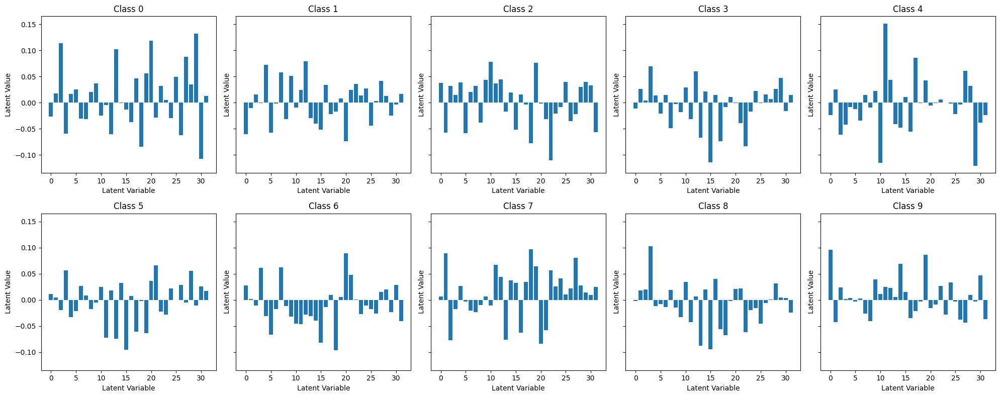

In [20]:
# Create bar plots to visualize the distribution of latent variables for each class
fig, axs = plt.subplots(2, 5, figsize=(20, 8), sharey=True)

for i, ax in enumerate(axs.flat):
    print(f"Class {i}:", mean_latentk_s[i])
    ax.bar(range(z_dim), mean_latentk_s[i])
    ax.set_title(f"Class {i}")
    ax.set_xlabel("Latent Variable")
    ax.set_ylabel("Latent Value")

plt.tight_layout()
plt.savefig("results/p1q3e.pdf")
plt.show()

In [11]:
with open(f"results/log/log" + ".json", 'r') as f:
    logger = json.load(f)

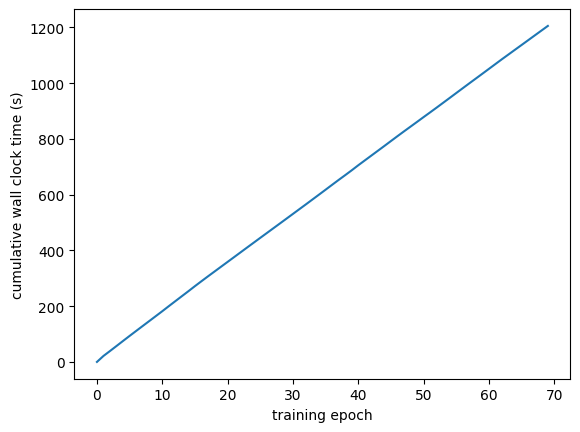

In [12]:
matplotlib.pyplot.figure("train_time")
matplotlib.pyplot.plot(logger["train_time"][:70])

matplotlib.pyplot.xlabel("training epoch")
matplotlib.pyplot.ylabel("cumulative wall clock time (s)")

matplotlib.pyplot.savefig("results/p1q3a1.pdf")
matplotlib.pyplot.show()

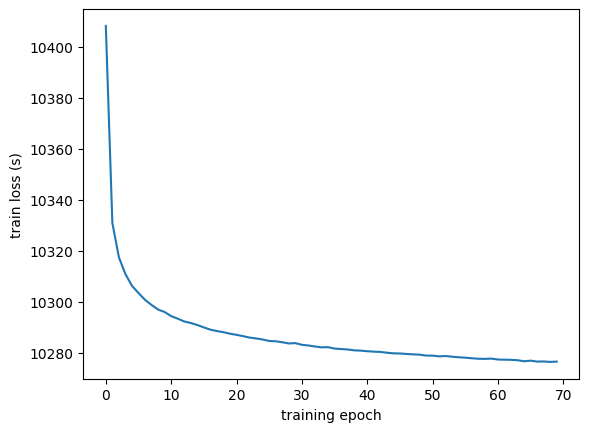

In [13]:
matplotlib.pyplot.figure("train_losses")
matplotlib.pyplot.plot(logger["train_losses"][:70])

matplotlib.pyplot.xlabel("training epoch")
matplotlib.pyplot.ylabel("train loss (s)")

matplotlib.pyplot.savefig("results/p1q3a2.pdf")
matplotlib.pyplot.show()

In [14]:
with open(f"results/data_dict" + ".pickle", 'rb') as f:
    data_dict = pickle.load(f)

In [15]:
for key in data_dict:
    for i, tensor in enumerate(data_dict[key]):
        data_dict[key][i] = (tensor.numpy(force=True) + 1) * 0.5

In [ ]:
# data_dict["origs"], data_dict["origs_valid"], data_dict["recons"], data_dict["recons_valid"], data_dict["samples"]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

<Figure size 640x480 with 0 Axes>

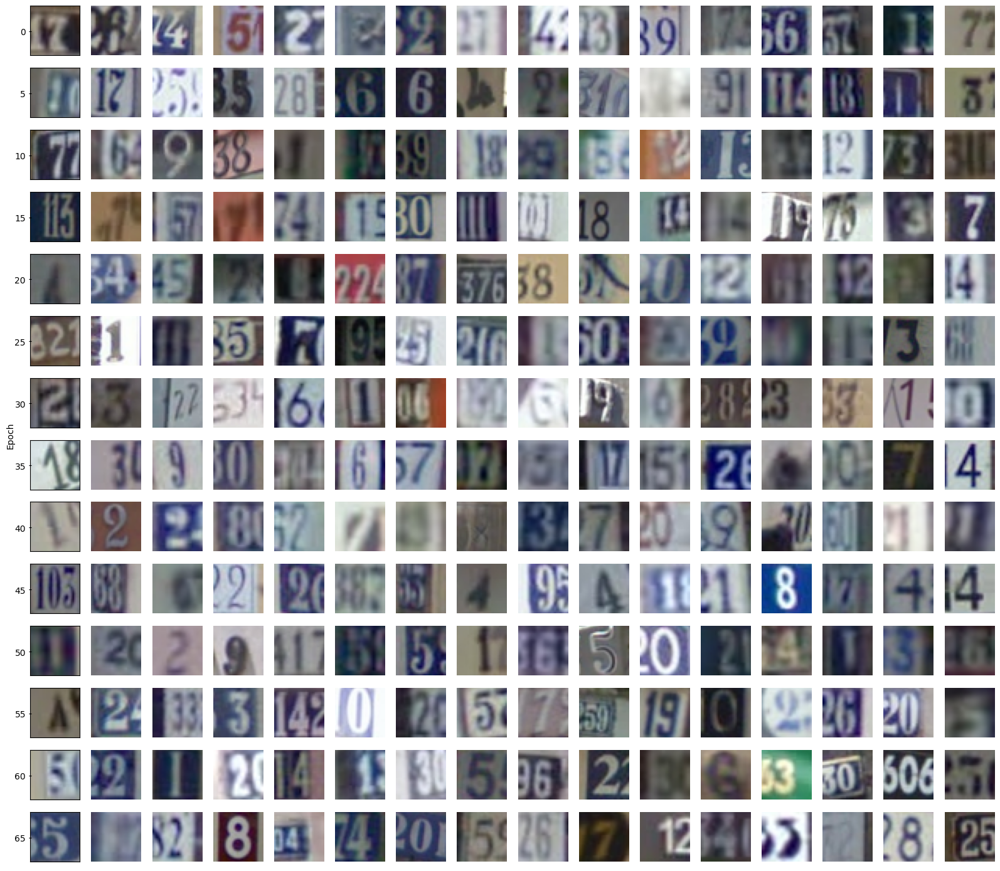

<Figure size 640x480 with 0 Axes>

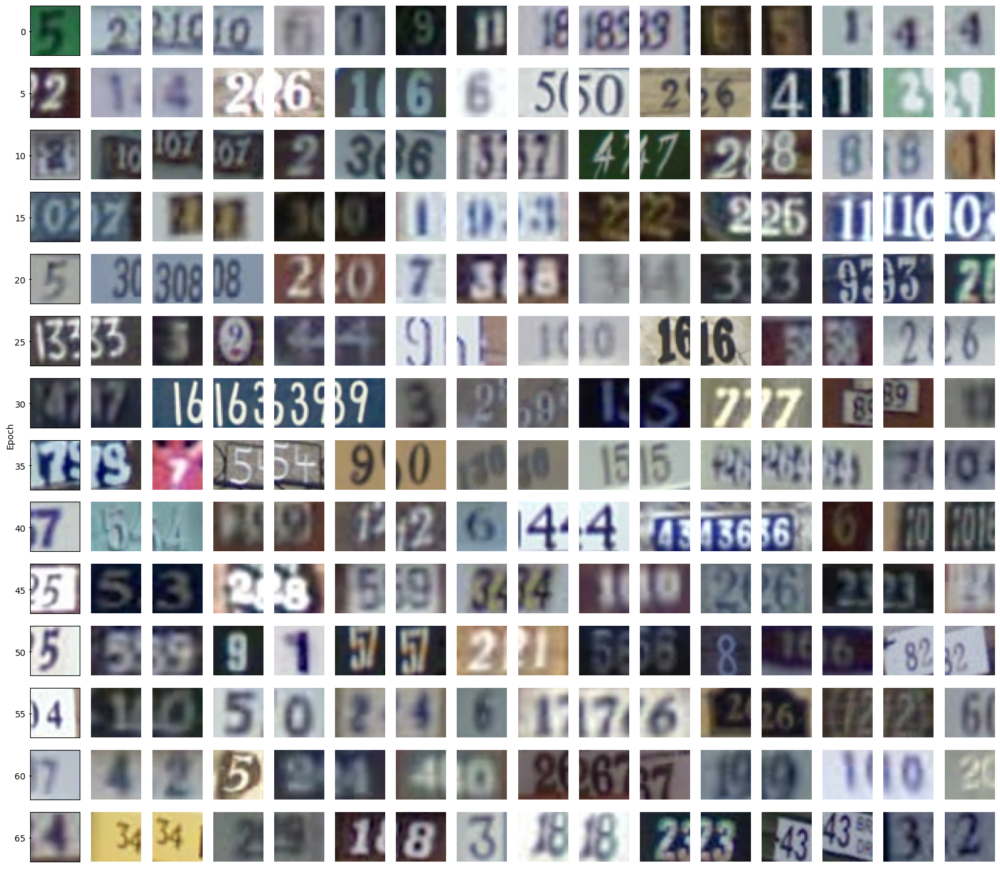

<Figure size 640x480 with 0 Axes>

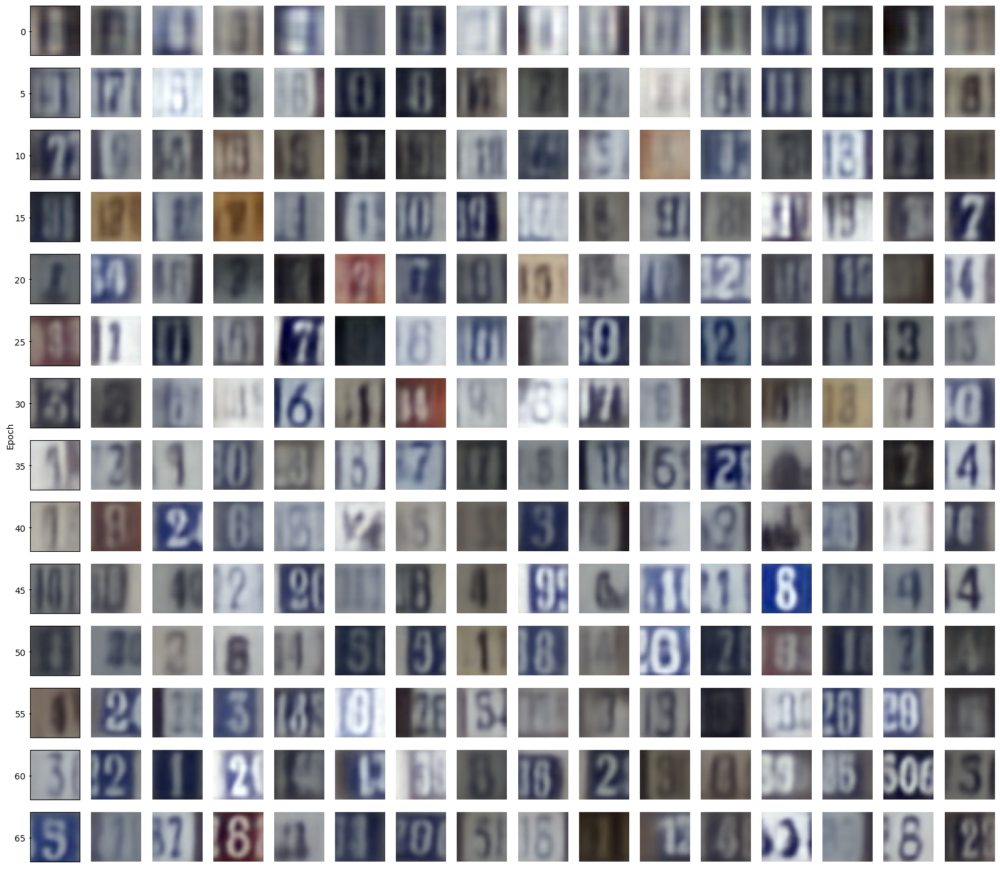

<Figure size 640x480 with 0 Axes>

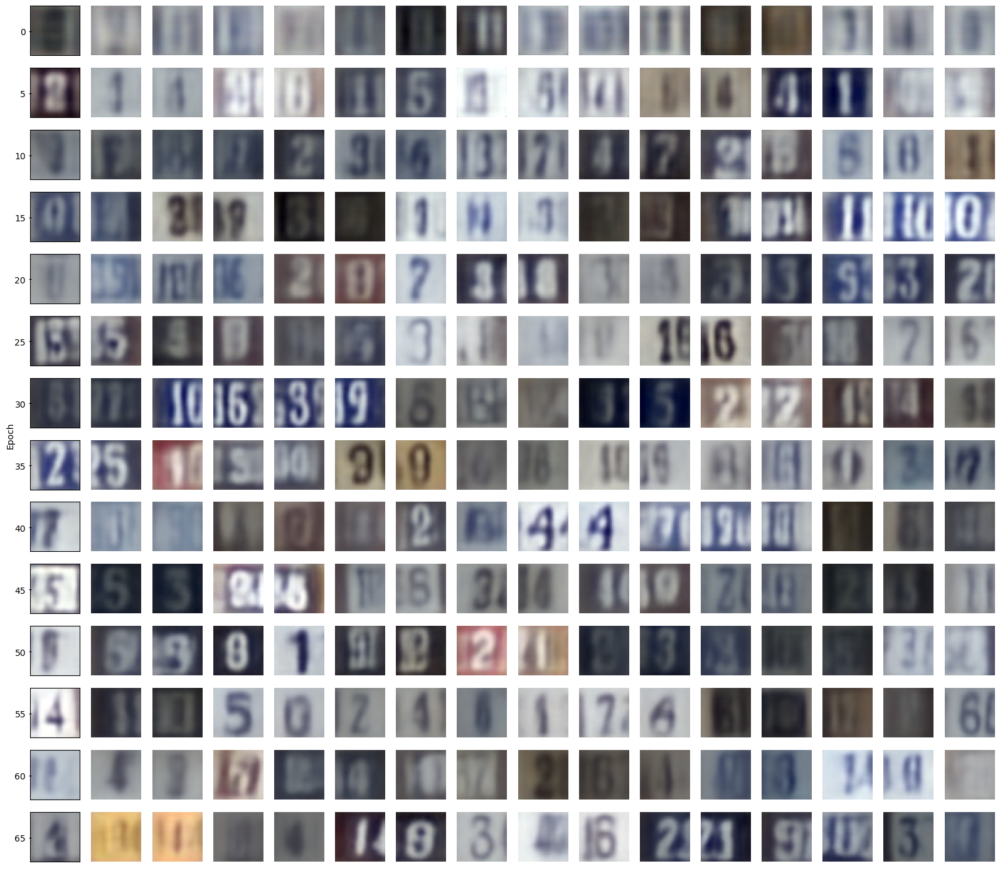

<Figure size 640x480 with 0 Axes>

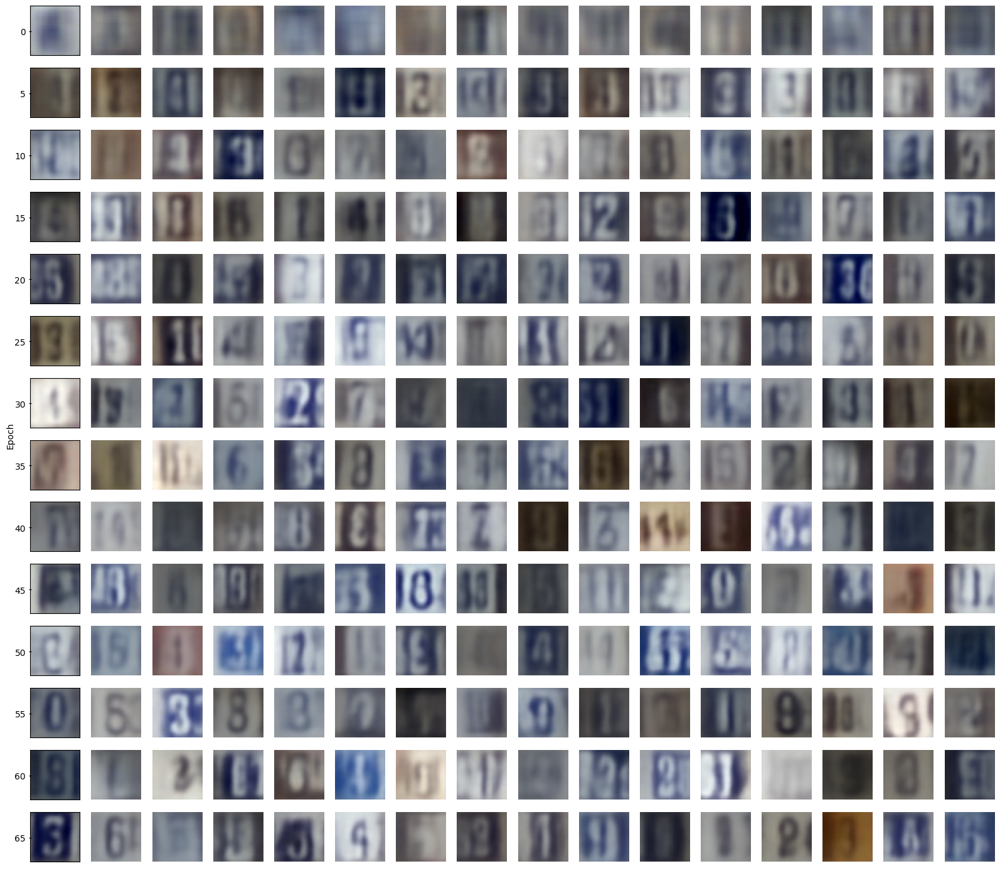

In [16]:
lst_fig_name = ["origs", "origs_valid", "recons", "recons_valid", "samples"]
for fig_name in lst_fig_name:

    jump, max_img = 5, 16
    image_list = data_dict[fig_name][::jump][:14]
    n = len(image_list)

    # Create a figure with 30 columns and 64 rows of subplots
    plt.figure(fig_name)
    fig, axs = plt.subplots(nrows=n, ncols=max_img, figsize=(max_img, n))
    fig.subplots_adjust(wspace=0.02)

    # Define a custom y-axis
    y_axis_labels = numpy.array(range(n)) * jump  # replace with your desired labels

    # Loop over the columns and rows of the subplot grid, and plot each small image
    for i in range(n):
        for j in range(max_img):
            axs[i, j].imshow(image_list[i][j].transpose(1, 2, 0))
            axs[i, j].axis('off')

        axs[i][0].axis('on')
        axs[i][0].set_xticks([])
        axs[i][0].set_yticks([16])
        axs[i][0].set_yticklabels([y_axis_labels[i]])
        axs[i][0].tick_params(axis='y', direction='inout', labelleft=True, labelright=False)

    fig.text(0.002, 0.5, 'Epoch', va='center', rotation='vertical')
    fig.tight_layout()

    fig.savefig("results/" + fig_name + ".pdf")

plt.show()

Once the training of the model is done, we can use the model to approximate the log-likelihood of the test data using the function that we defined above.

In [29]:
with open(f"results/models/model_{70}" + ".pickle", 'rb') as f:
    model = pickle.load(f)

Finally, we also visualize the interpolation between two points in the latent space: $z_1$ and $z_2$ by choosing points at equal intervals on the line from the two points.

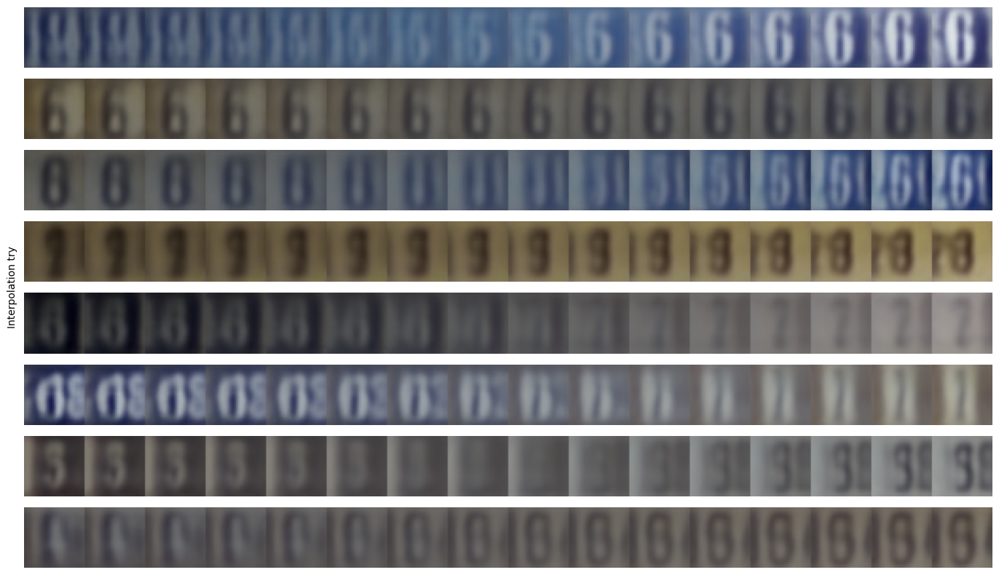

In [32]:
def interpolate(model, z_1, z_2, n_samples):
    lengths = torch.linspace(0, 1, n_samples).unsqueeze(1).to(device)
    z = lengths * z_1 + (1 - lengths) * z_2
    return model.decode(z).mode()


if __name__ == '__main__':

    n, max_img = 8, 16
    fig, axs = plt.subplots(nrows=n, ncols=1, figsize=(max_img, n))

    for i in range(n):
        z_1 = torch.randn(1, z_dim).to(device)
        z_2 = torch.randn(1, z_dim).to(device)
        interp = interpolate(model, z_1, z_2, 16)

        grid_img = make_grid(interp.detach().cpu(), nrow=16, padding=0)
        grid_img = (grid_img + 1) * 0.5
        axs[i].imshow(grid_img.permute(1, 2, 0))
        axs[i].axis('off')

    fig.text(0.07, 0.5, 'Interpolation try', va='center', rotation='vertical')
    fig.tight_layout()

    plt.savefig("results/" + "interpolate" + ".pdf")
    plt.show()

In [ ]:
train_dataloader, testing_dataloader = get_dataloaders(data_root, batch_size=train_batch_size)
test_iter = list(testing_dataloader)
train_iter = list(train_dataloader)[:-1] # todo

In [ ]:
with open(f"results/models/model_{29}" + ".pickle", 'rb') as f:
    model = pickle.load(f)

In [ ]:
latent_list = []
label_list = []
for x, y in train_iter[:]:
    # x, y = x[[35, 3, 2, 11, 8, 0, 5, 45, 40, 1]], y[[35, 3, 2, 11, 8, 0, 5, 45, 40, 1]]
    for q in range(500):
        latent_z = model.encode(x.to(device)).sample()
        label_list.append(y.cpu().detach().numpy())
        latent_list.append(latent_z.cpu().detach().numpy())

In [ ]:
label_list = numpy.array(label_list)
latent_list = numpy.array(latent_list)

In [ ]:
mean_latentk_s = []
for k in range(10):
    idx_labelk = numpy.where(label_list == k)
    latent_labelk = latent_list[idx_labelk]
    mean_latentk = numpy.mean(latent_labelk, axis=0)
    mean_latentk_s.append(mean_latentk)

In [ ]:
# Create bar plots to visualize the distribution of latent variables for each class
fig, axs = plt.subplots(2, 5, figsize=(20, 8), sharey=True)

for i, ax in enumerate(axs.flat):
    ax.bar(range(z_dim), mean_latentk_s[i])
    ax.set_title(f"Class {i}")
    ax.set_xlabel("Latent Variable")
    ax.set_ylabel("Latent Value")

plt.tight_layout()
plt.savefig("results/p1q3e.pdf")
plt.show()